In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.base import BaseEstimator
from scipy.spatial.distance import cdist
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
from sklearn import ensemble
from sklearn.ensemble import RandomForestRegressor
from sklearn.cluster import DBSCAN

## Датасет

1. Скачайте датасет с https://www.kaggle.com/mlg-ulb/creditcardfraud#creditcard.csv и

In [2]:
data = pd.read_csv('creditcard.csv')

## EDA

2. Проведите небольшой EDA (гистограммы и описательные статистики - обязательно)

In [3]:
data.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [5]:
data.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.165980e-15,3.416908e-16,-1.373150e-15,2.086869e-15,9.604066e-16,1.490107e-15,-5.556467e-16,1.177556e-16,-2.406455e-15,...,1.656562e-16,-3.444850e-16,2.578648e-16,4.471968e-15,5.340915e-16,1.687098e-15,-3.666453e-16,-1.220404e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


In [6]:
data.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [7]:
data.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

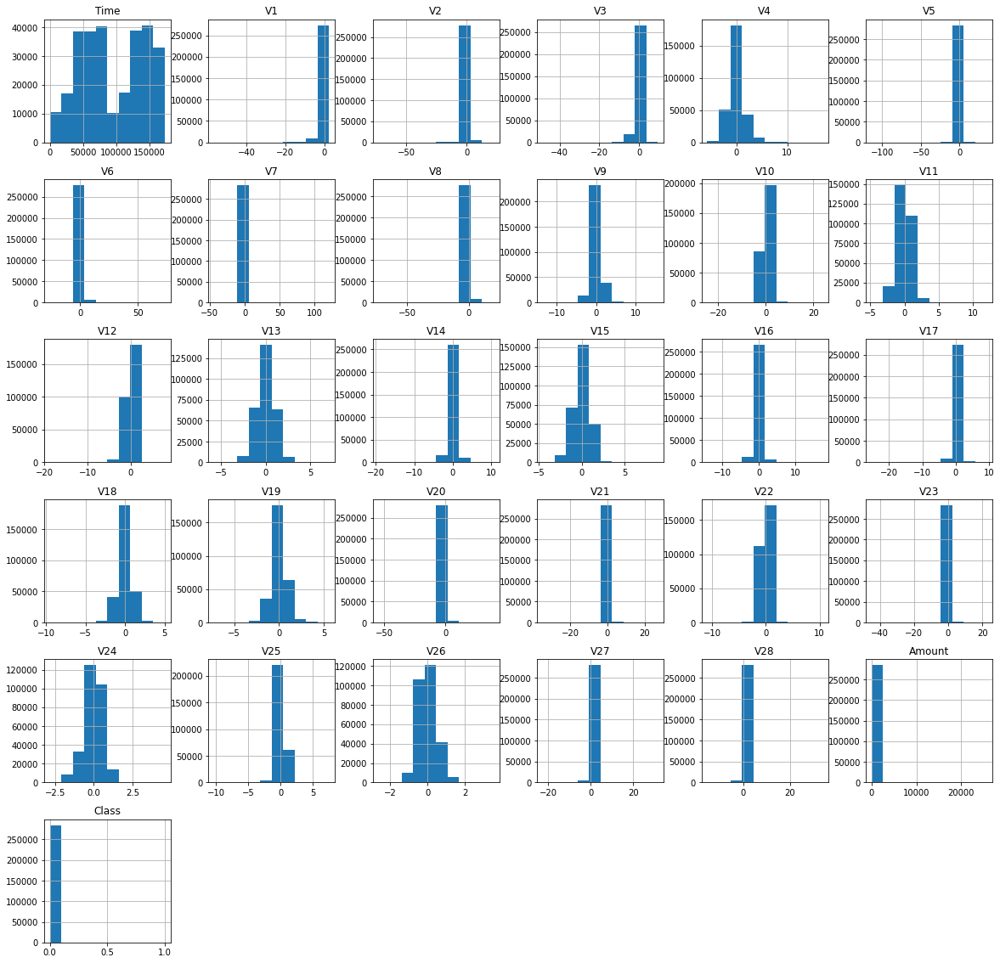

In [8]:
data.hist(figsize=(20, 20));

In [9]:
data.shape

(284807, 31)

#### 3. Воспользуйтесь процентом аномалий, подсчитанным по переменной Class, как "экспертной оценкой" загрязненности нашего датасета

In [10]:
#Посмотрим соотношение фрода и не фрода
print('Не мошейники', round(data['Class'].value_counts()[0]/len(data)*100,2), '%')
print('Мошейники', round(data['Class'].value_counts()[1]/len(data)*100,2), '%')

Не мошейники 99.83 %
Мошейники 0.17 %


In [11]:
data_sample = data.sample(frac = 0.1, random_state = 1).copy()

In [12]:
data_sample.shape

(28481, 31)

In [13]:
#Посмотрим соотношение фрода и не фрода
print('Не мошейники', round(data_sample['Class'].value_counts()[0]/len(data_sample)*100,2), '%')
print('Мошейники', round(data_sample['Class'].value_counts()[1]/len(data_sample)*100,2), '%')

Не мошейники 99.83 %
Мошейники 0.17 %


array([[<AxesSubplot:title={'center':'Time'}>,
        <AxesSubplot:title={'center':'V1'}>,
        <AxesSubplot:title={'center':'V2'}>,
        <AxesSubplot:title={'center':'V3'}>,
        <AxesSubplot:title={'center':'V4'}>,
        <AxesSubplot:title={'center':'V5'}>],
       [<AxesSubplot:title={'center':'V6'}>,
        <AxesSubplot:title={'center':'V7'}>,
        <AxesSubplot:title={'center':'V8'}>,
        <AxesSubplot:title={'center':'V9'}>,
        <AxesSubplot:title={'center':'V10'}>,
        <AxesSubplot:title={'center':'V11'}>],
       [<AxesSubplot:title={'center':'V12'}>,
        <AxesSubplot:title={'center':'V13'}>,
        <AxesSubplot:title={'center':'V14'}>,
        <AxesSubplot:title={'center':'V15'}>,
        <AxesSubplot:title={'center':'V16'}>,
        <AxesSubplot:title={'center':'V17'}>],
       [<AxesSubplot:title={'center':'V18'}>,
        <AxesSubplot:title={'center':'V19'}>,
        <AxesSubplot:title={'center':'V20'}>,
        <AxesSubplot:title={'center':'V

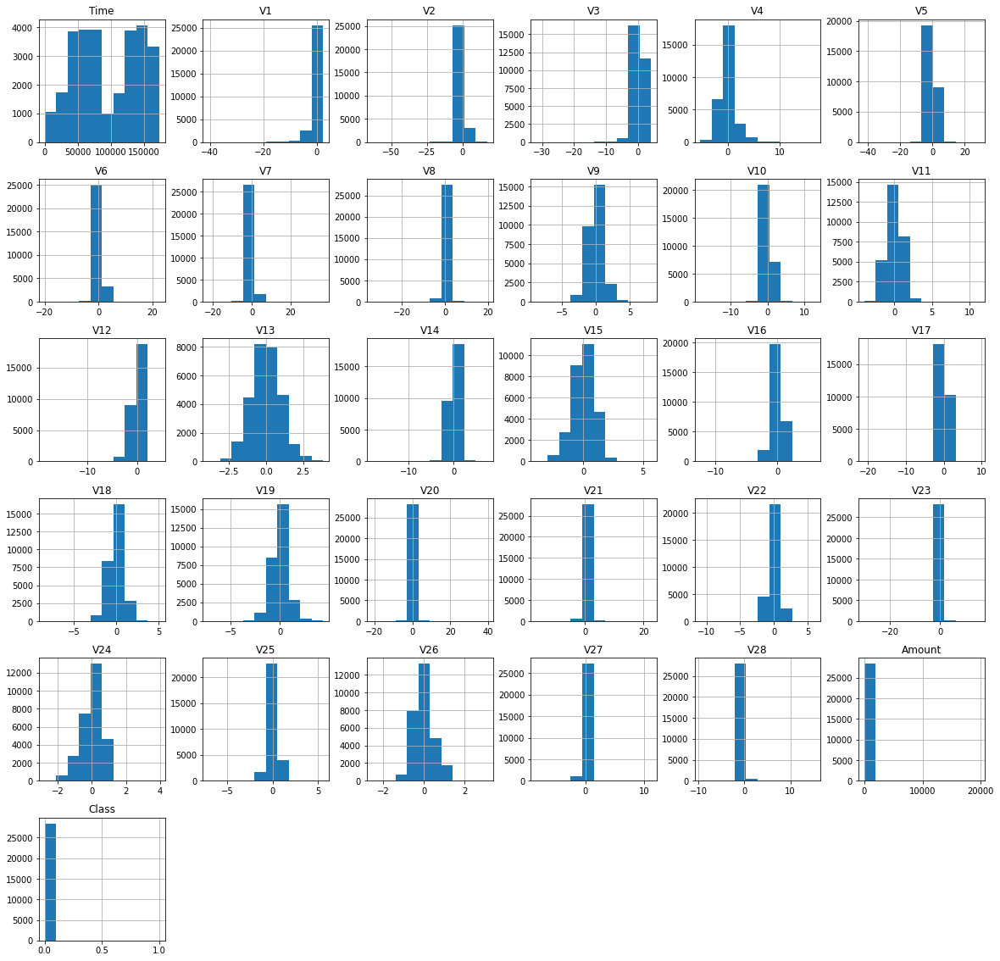

In [14]:
data_sample.hist(figsize = (20,20))

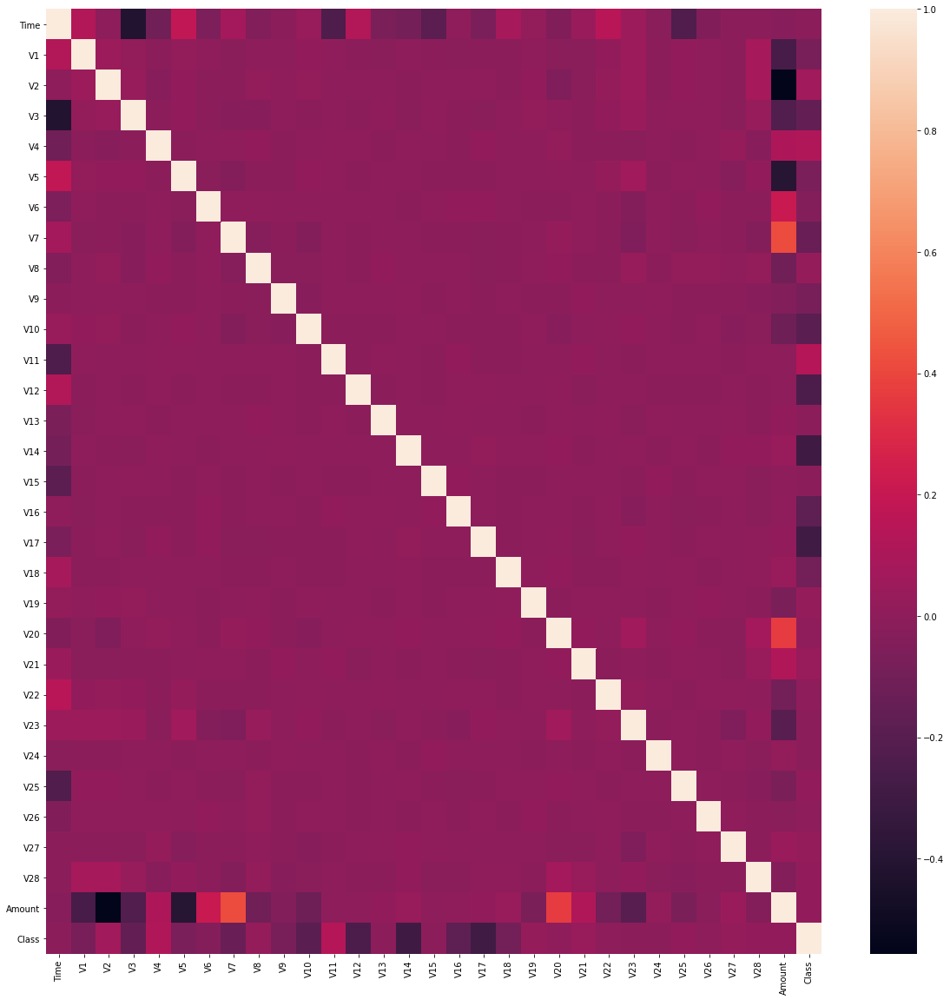

In [15]:
corr = data_sample.corr()
lower = corr.where(np.tril(np.ones(corr.shape), k=-1).astype(np.bool))
fig = plt.figure(figsize = (20,20))
sns.heatmap(corr)
plt.show()

In [16]:
high_corr = [
    column for column in lower.columns if any((lower[column] > 0.6)|(lower[column] < -0.6))
]
high_corr

[]

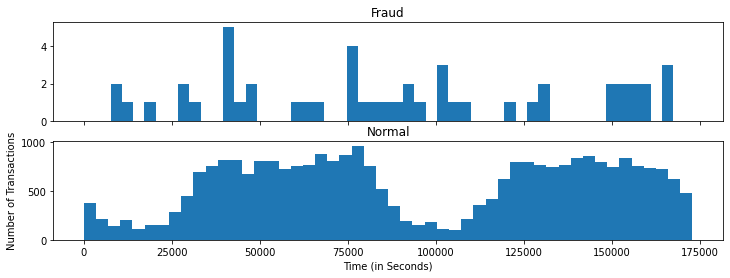

In [17]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True, figsize=(12,4))

bins = 50

ax1.hist(data_sample.Time[data_sample.Class == 1], bins = bins)
ax1.set_title('Fraud')

ax2.hist(data_sample.Time[data_sample.Class == 0], bins = bins)
ax2.set_title('Normal')

plt.xlabel('Time (in Seconds)')
plt.ylabel('Number of Transactions')
plt.show()

Разделем на test и train

In [18]:
X_train, X_test, y_train, y_test = train_test_split(data_sample.drop(['Class'], axis=1), data_sample['Class'], test_size=0.3, random_state=0)

Так как мы имеем дело с расстояниями - нужно убедиться, что все данные в одном масштабе

Отнормируем 'Time' и 'Amount'. Выбросов много, поэтому RobustScaler

In [19]:
TO_SCALE = ['Time', 'Amount']
scaler = RobustScaler()
train_scaled_data = scaler.fit_transform(X_train[TO_SCALE])
test_scaled_data = scaler.transform(X_test[TO_SCALE])
X_train[TO_SCALE] = train_scaled_data
X_test[TO_SCALE] = test_scaled_data

In [20]:
#Посмотрим соотношение фрода и не фрода
print('Не мошейники обучение', round(y_train.value_counts()[0]/len(data_sample)*100,2), '%')
print('Мошейники обучение', round(y_train.value_counts()[1]/len(data_sample)*100,2), '%')

print('Не мошейники тест', round(y_test.value_counts()[0]/len(data_sample)*100,2), '%')
print('Мошейники тест', round(y_test.value_counts()[1]/len(data_sample)*100,2), '%')

Не мошейники обучение 69.87 %
Мошейники обучение 0.13 %
Не мошейники тест 29.96 %
Мошейники тест 0.04 %


In [21]:
X_train.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
187312,0.499126,-0.332037,1.051703,-0.129951,-0.622234,0.575006,-1.045691,1.253179,-0.512433,0.551195,...,0.265841,-0.289073,-0.235837,0.109399,0.016517,-0.604663,0.135007,0.198718,0.034073,0.009419
235927,0.746813,0.039443,-4.265278,-2.907907,0.181922,-1.521177,-1.095879,1.489105,-0.780382,-0.639555,...,2.232621,0.868856,0.023698,-0.975243,0.150192,-0.126670,-0.166181,-0.270911,0.123432,15.856611
80695,-0.308404,-0.403042,1.102567,1.390620,-0.153212,0.343935,-0.605229,0.764210,-0.115231,-0.582643,...,0.216558,-0.240960,-0.567049,-0.096097,-0.093256,-0.075939,0.097197,0.273282,0.119863,-0.284670
51145,-0.470163,1.263361,0.145220,0.340288,0.091951,-0.442896,-1.113045,0.165025,-0.317986,-0.057839,...,0.038772,-0.205966,-0.573076,0.081517,0.466165,0.212101,0.809102,-0.080087,0.010679,-0.036128
241020,0.773173,-0.954076,0.651764,0.819535,-2.391533,-0.194032,0.810651,-1.550834,-3.339723,-0.906848,...,0.571410,-0.005620,1.654356,-0.044942,0.298802,-0.106292,-0.129382,0.175252,0.206410,-0.281718


In [22]:
X_test.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
182688,0.476026,-0.621322,-0.242695,1.391185,-3.365810,-0.118853,0.383291,-0.233758,0.173277,-2.393689,...,-0.076936,-0.175945,-0.035608,-0.430511,0.093655,0.771208,-0.136750,0.274821,0.105107,-0.141140
131983,-0.059791,-0.210098,0.813344,0.254998,0.418462,2.754304,3.810643,-0.486869,0.156342,-1.211950,...,-0.180631,0.418924,-1.680593,-0.576711,0.951566,1.380018,-0.225479,0.052885,0.151475,-0.102200
108378,-0.164644,-2.015322,-0.769885,0.141497,1.882541,-2.473437,1.050718,2.881227,0.285992,-0.739290,...,1.653763,0.471707,0.240793,1.732952,0.323477,0.191392,-0.264533,0.038436,0.199038,10.514515
81190,-0.305895,-7.277992,4.641130,-1.891091,-2.271261,-1.970527,-0.753155,-0.736258,1.693957,3.192361,...,1.671725,-0.682792,-0.203810,0.336190,0.011039,0.474675,0.611468,0.032233,-1.136778,-0.299009
19174,-0.643109,1.399329,-1.438127,1.094228,-1.278320,-1.986799,0.136602,-1.690241,0.217732,-1.187155,...,-0.317778,-0.208341,-0.127309,0.005161,-0.023114,0.236133,-0.192052,0.068084,0.020773,0.111900


Фич много, попробуем отобрать самые значимые

/home/nata/.local/lib/python3.6/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


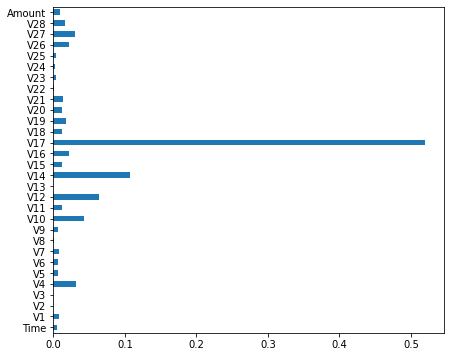

In [23]:
model = RandomForestRegressor(1, oob_score = True, random_state =99)
# The labels are in the last column ('Class'). 

features=data.iloc[:, :-1]
labels=data['Class']

features_scaled_data = scaler.fit_transform(features[TO_SCALE])
features[TO_SCALE] = features_scaled_data

model.fit(features,labels)

feature_importance = pd.Series(model.feature_importances_, index = features.columns)
feature_importance.plot( kind = 'barh', figsize = (7,6));

/home/nata/.local/lib/python3.6/site-packages/sklearn/ensemble/_forest.py:832: UserWarning: Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable oob estimates.
  warn("Some inputs do not have OOB scores. "


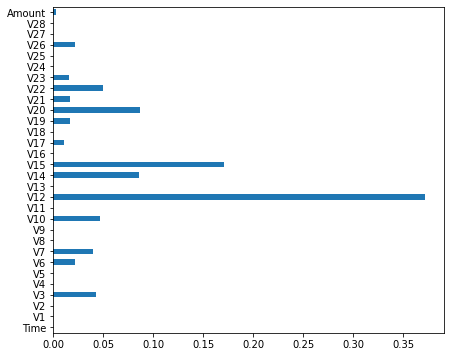

In [24]:
model.fit(X_train,y_train)
feature_importance = pd.Series(model.feature_importances_, index = X_train.columns)
feature_importance.plot( kind = 'barh', figsize = (7,6));

Cтранно, что время бесполезно, мб выборка не удачная. Уберем бесполезные

In [25]:
# Dropping the least important Features
X_train = X_train.drop(['V2','V3','V5','V8','V9','V13','V22','V23','V24','V25'], axis =1)
X_test = X_test.drop(['V2','V3','V5','V8','V9','V13','V22','V23','V24','V25'], axis =1)
data_sample_imp = data_sample.drop(['V2','V3','V5','V8','V9','V13','V22','V23','V24','V25'], axis =1)

In [26]:
data_sample_imp_feature = data_sample_imp.iloc[:, :-1]
features_scaled_data = scaler.fit_transform(data_sample_imp_feature[TO_SCALE])
data_sample_imp_feature[TO_SCALE] = features_scaled_data

In [27]:
data_sample_imp_feature.head()

,Time,V1,V4,V6,V7,V10,V11,V12,V14,V15,V16,V17,V18,V19,V20,V21,V26,V27,V28,Amount
169876,0.413675,-0.611712,-0.224877,-2.019887,0.292491,0.070050,-0.854023,0.547347,-0.101785,-0.608492,-0.288559,-0.606199,-0.900746,-0.201311,-0.196039,-0.075208,-0.201146,0.066501,0.221180,-0.281837
127467,-0.072670,-0.814682,0.027273,-0.653985,0.321552,-0.600684,0.096501,0.710309,0.353867,0.953048,-0.103542,0.128899,-0.964070,-0.477130,-0.009041,-0.128619,0.080621,0.162427,0.059456,-0.279232
137900,-0.025378,-0.318193,-0.127052,-0.532484,0.706252,-0.528357,-0.813214,0.111898,-0.649766,0.861035,0.583787,-0.344094,0.028312,0.219760,0.206028,-0.305402,0.121679,0.249050,0.092516,-0.294174
21513,-0.618173,-1.328271,-1.574193,-0.457733,0.681867,0.334853,0.905210,-0.277872,-0.012238,0.212828,0.769345,-1.010534,0.357288,-0.125585,0.315823,-0.220815,0.814177,0.098797,-0.004273,-0.087320
134700,-0.042449,1.276712,0.879173,-1.472002,0.373692,-0.696578,0.101512,-0.433200,-1.188354,1.028063,0.576121,1.068353,0.332690,-0.362811,-0.105286,-0.160161,0.370701,-0.034255,0.041709,-0.295956


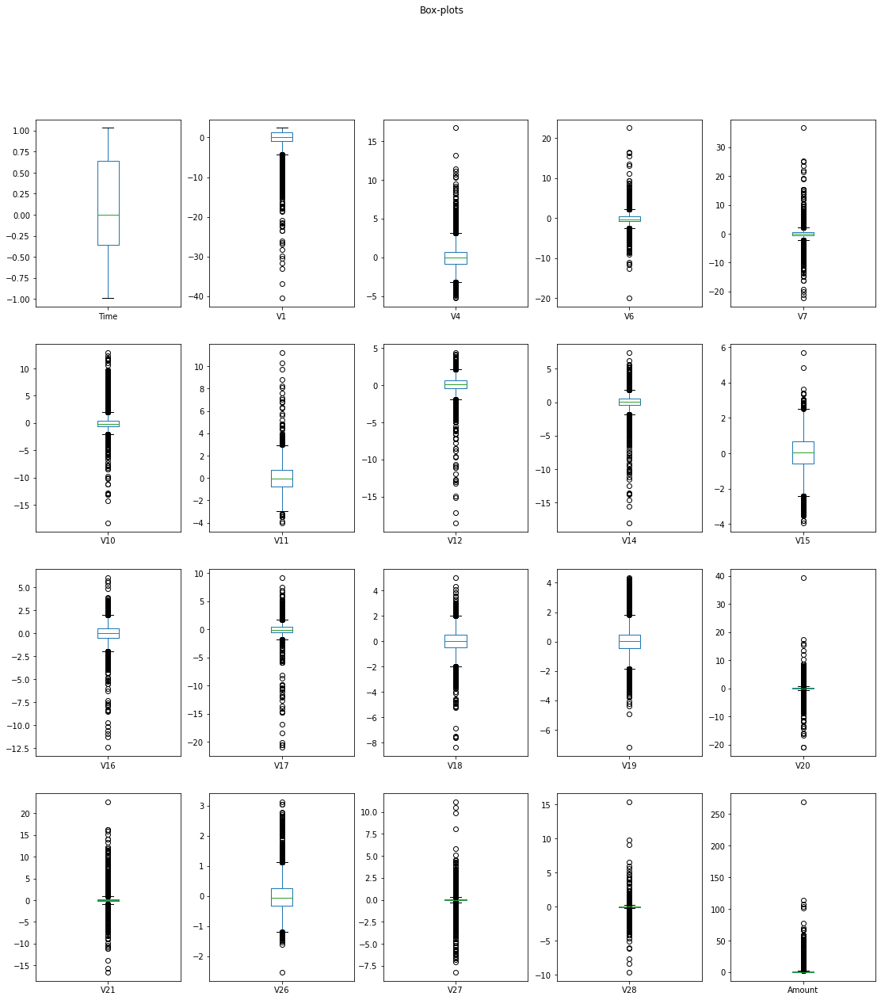

In [28]:
fig, axes = plt.subplots(4, 5, figsize=(19, 20))
fig.suptitle('Box-plots')

row=0
col=0

for ax, feature in enumerate(data_sample_imp_feature):
    data_sample_imp_feature[feature].plot.box(ax=axes[row, col])
    col+=1
    if col > 4:
        row+=1
        col=0

# Простейшие методы

#### 4.  Попробуйте построить различные модели и алгоритмы, разобранные на занятии, используя полученную экспертную оценку для настройки параметров

## 3-сигмы

In [29]:
def outlier_std(data, col, threshold=3):
    mean = data[col].mean()
    std = data[col].std()
    up_bound = mean + threshold * std
    low_bound = mean - threshold * std
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [30]:
def get_column_outliers(data, columns=None, function=outlier_std, threshold=3):
    if columns:
        columns_to_check = columns
    else:
        columns_to_check = data.columns
        
    outliers = pd.Series(data=[False]*len(data), index=data.index, name='is_outlier')
    comparison_table = {}
    for column in columns_to_check:
        anomalies, upper_bound, lower_bound = function(data, column, threshold=threshold)
        comparison_table[column] = [upper_bound, lower_bound, sum(anomalies), 100*sum(anomalies)/len(anomalies)]
        outliers[anomalies[anomalies].index] = True
    
    comparison_table = pd.DataFrame(comparison_table).T
    comparison_table.columns=['upper_bound', 'lower_bound', 'anomalies_count', 'anomalies_percentage']
    comparison_table = comparison_table.sort_values(by='anomalies_percentage', ascending=False)
    
    return comparison_table, outliers

def anomalies_report(outliers):
    print("Total number of outliers: {}\nPercentage of outliers:   {:.2f}%".format(
            sum(outliers), 100*sum(outliers)/len(outliers)))

In [31]:
comparison_table, std_outliers = get_column_outliers(data_sample_imp_feature)
anomalies_report(std_outliers)

Total number of outliers: 3253
Percentage of outliers:   11.42%


Вопрос: если я знаю, что в выборке 0.17% выбросов. Я должна настроить threshold , чтобы получить такой же размер? 

In [32]:
comparison_table, std_outliers = get_column_outliers(data_sample_imp_feature, threshold=16)
anomalies_report(std_outliers)

Total number of outliers: 52
Percentage of outliers:   0.18%


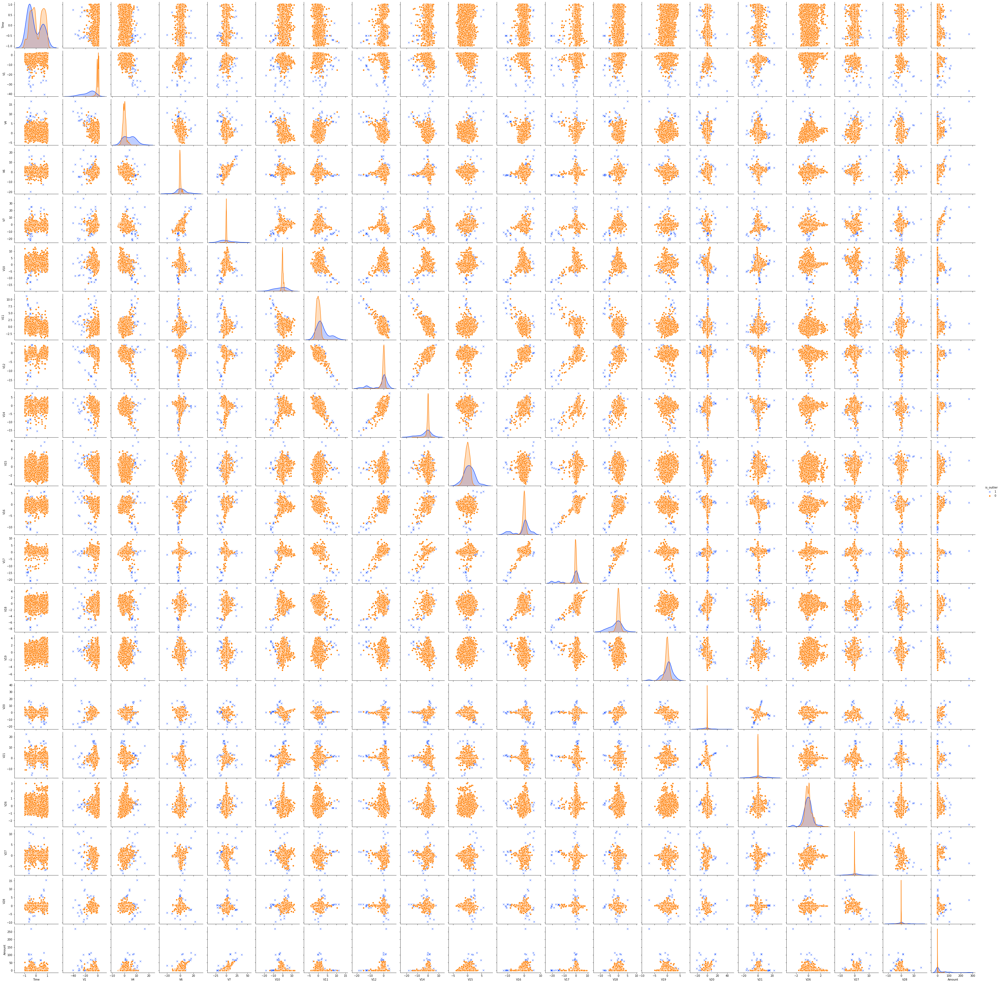

In [33]:
labeled_data = data_sample_imp_feature.copy()
labeled_data['is_outlier'] = std_outliers

sns.pairplot(data=labeled_data, vars = data_sample_imp_feature.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

Выбросы по краям, выглядит адекватно

## Межквартильное отклонение

In [34]:
def outlier_iqr(data, col, threshold=3):
    IQR = data[col].quantile(0.75) - data[col].quantile(0.25)
    up_bound = data[col].quantile(0.75) + (IQR * threshold)
    low_bound = data[col].quantile(0.25) - (IQR * threshold)
    anomalies = pd.concat([data[col]>up_bound, data[col]<low_bound], axis=1).any(1)
    return anomalies, up_bound, low_bound

In [35]:
comparison_table, iqr_outliers = get_column_outliers(data_sample_imp_feature, function=outlier_iqr, threshold=43)
anomalies_report(iqr_outliers)

Total number of outliers: 42
Percentage of outliers:   0.15%


## Кластеризация

In [36]:
class DistanceOutliers(BaseEstimator):
    """
    -----------
    Parameters:
    
    - metric: string, default - euclidean
        metric to use for distance calculation (see scipy.spatial.distance.cdist)
        
    - percentile: float in range [0, 100]
        hyperparameter which sets the threshold for anomalies
    """
    def __init__(self, metric='euclidean', percentile=90):
        self.metric = metric
        self.percentile = percentile
        
    def fit(self, X):
        self.centroid = np.mean(X, axis=0).values.reshape(-1, 1).T
        distances_train = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        self.threshold = np.percentile(distances_train, self.percentile)
        
    def predict(self, X):
        distances = cdist(self.centroid, X, metric=self.metric).reshape(-1)
        predictions = (distances > self.threshold).astype(int)
        return predictions

6. При помощи tSNE и/или UMAP, постройте сжатое представление исходных данных и проверьте, действительно ли аномалии лежат достаточно далеко от основной массы точек

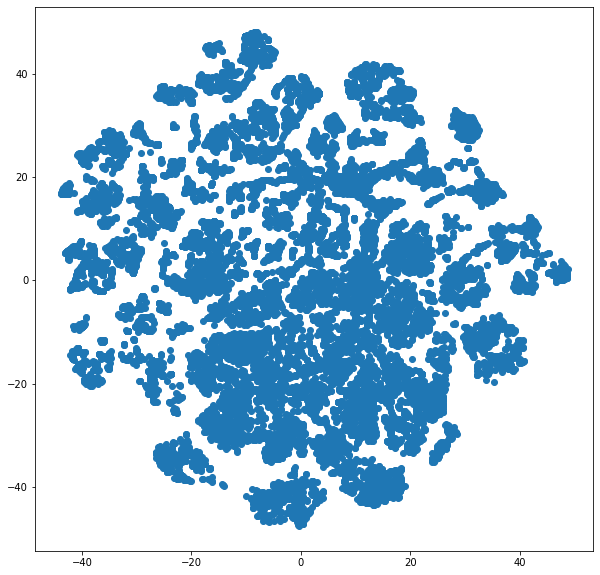

In [37]:
from MulticoreTSNE import MulticoreTSNE as TSNE
tsne = TSNE(perplexity=50, n_jobs=-1)
tsne_transformed = tsne.fit_transform(data_sample_imp_feature)

plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1]);

In [38]:
euclidian_model = DistanceOutliers(metric='euclidean', percentile=99.8)
euclidian_model.fit(data_sample_imp_feature)
euclidian_outliers = euclidian_model.predict(data_sample_imp_feature)
anomalies_report(euclidian_outliers)

Total number of outliers: 57
Percentage of outliers:   0.20%


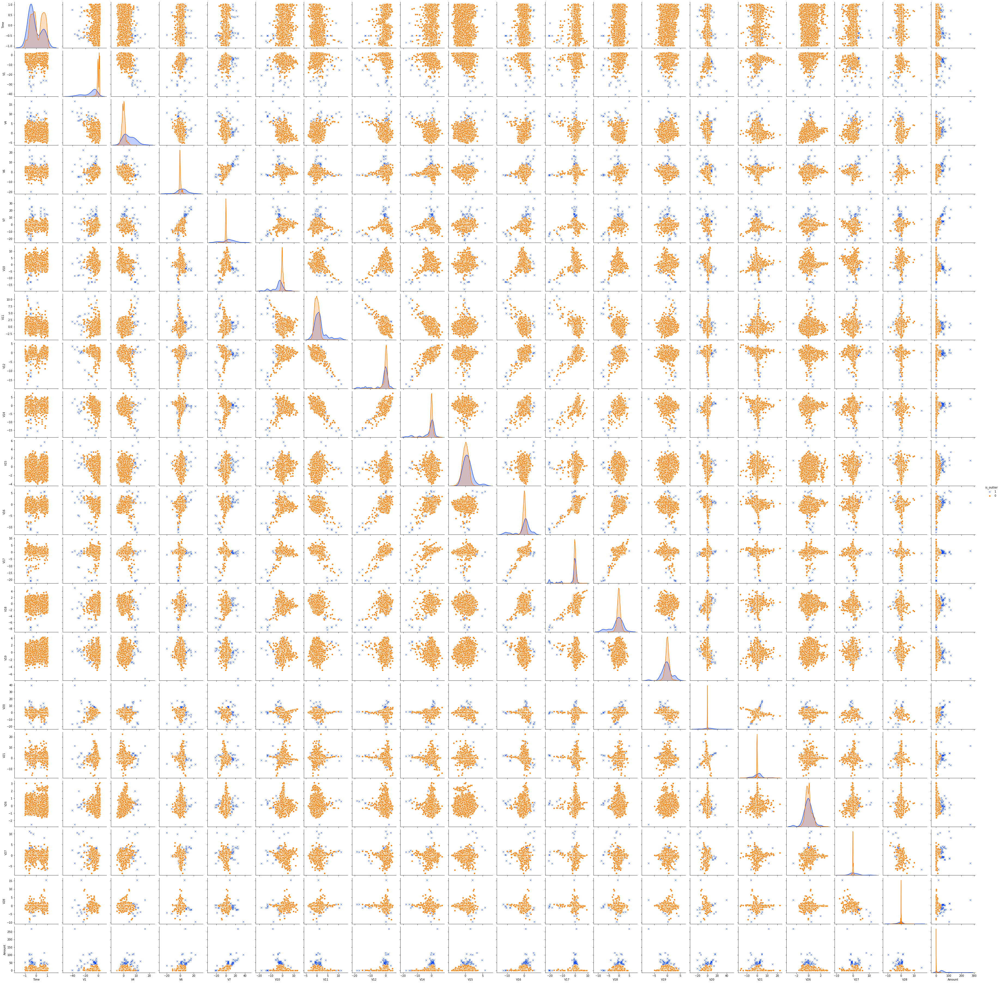

In [39]:
labeled_data = data_sample_imp_feature.copy()
labeled_data['is_outlier'] = euclidian_outliers

sns.pairplot(data=labeled_data, vars = data_sample_imp_feature.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

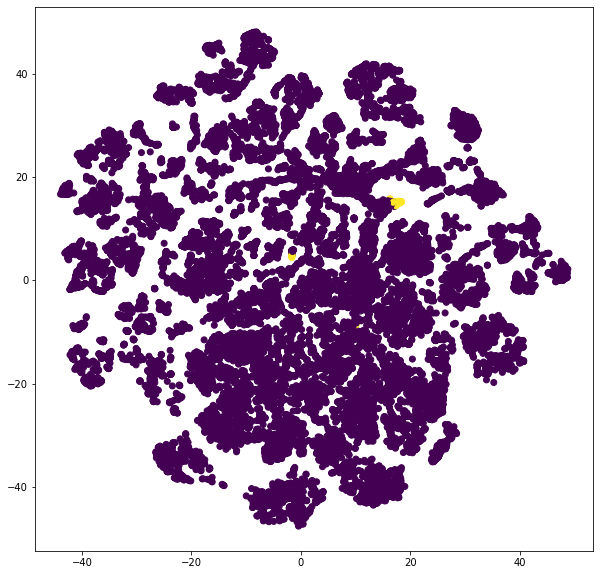

In [40]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=euclidian_outliers);

In [41]:
citiblock_model = DistanceOutliers(metric='cityblock', percentile=99.8)
citiblock_model.fit(data_sample_imp_feature)
cityblock_outliers = citiblock_model.predict(data_sample_imp_feature)
anomalies_report(cityblock_outliers)

labeled_data = data_sample_imp_feature.copy()
labeled_data['is_outlier'] = cityblock_outliers

Total number of outliers: 57
Percentage of outliers:   0.20%


DBSCAN

In [42]:
# для начала считаем все наблюдения аномальными
outlier_percentage = 1.

num_clusters = []
anomaly_percentage = []

# берем маленький эпсилон и начинаем увеличивать
eps = 0.5
eps_history = [eps]
while outlier_percentage>0.0017:    
    model = DBSCAN(eps=eps).fit(data_sample_imp_feature)
    labels = model.labels_
    num_clusters.append(len(np.unique(labels))-1)
    labels = np.array([1 if label == -1 else 0 for label in labels])
    # считаем текущий процент "шума"
    outlier_percentage = sum(labels==1) / len(labels)    
    eps += 0.1
    eps_history.append(eps)
    anomaly_percentage.append(outlier_percentage)
    

KeyboardInterrupt: 

In [ ]:
print(eps)

In [43]:
model = DBSCAN(9.5)
model.fit(data_sample_imp_feature)
density_outlier = np.array([1 if label == -1 else 0 for label in model.labels_])

In [44]:
anomalies_report(density_outlier)

Total number of outliers: 51
Percentage of outliers:   0.18%


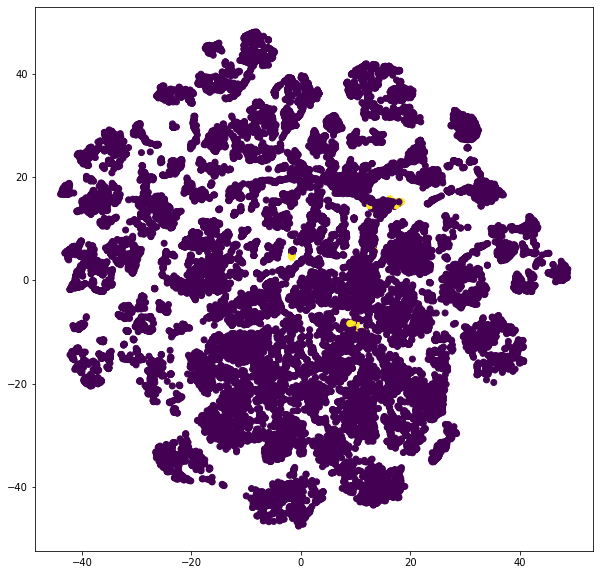

In [45]:
plt.figure(figsize=(10, 10))
plt.scatter(tsne_transformed[:, 0], tsne_transformed[:, 1], c=density_outlier);

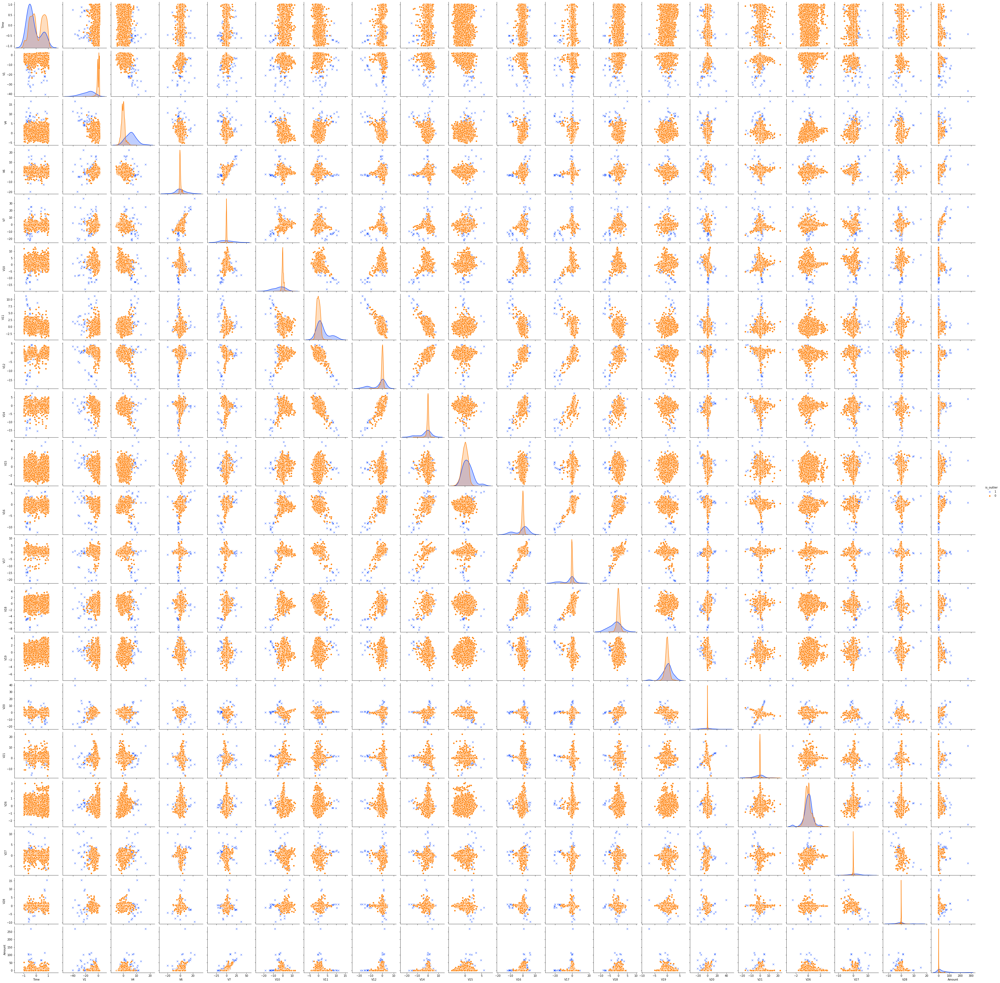

In [47]:
labeled_data = data_sample_imp_feature.copy()
labeled_data['is_outlier'] = density_outlier

sns.pairplot(data=labeled_data, vars = data_sample_imp_feature.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

#### 5. Воспользуйтесь стандартными методами оценки качества бинарной классификации (особенно хорошо подойдёт classification report и confusion matrix), и, используя предсказания моделей и переменную Class, проверьте, действительно ли модели справляются со своей задачей и на сколько хорошо они это делают

In [48]:
print(classification_report(data_sample['Class'],density_outlier))
tn, fp, fn, tp = confusion_matrix(data_sample['Class'],density_outlier).ravel()
print(tn, fp, fn, tp)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     28432
           1       0.18      0.18      0.18        49

    accuracy                           1.00     28481
   macro avg       0.59      0.59      0.59     28481
weighted avg       1.00      1.00      1.00     28481

28390 42 40 9


Вывод: так себе точность

One-Class SVM

In [49]:
from sklearn.svm import OneClassSVM

one_class_svm = OneClassSVM(nu=0.0013, gamma='auto')
one_class_svm.fit(X_train)
svm_outliers = one_class_svm.predict(X_test)
svm_outliers = np.array([1 if label == -1 else 0 for label in svm_outliers])

In [50]:
anomalies_report(svm_outliers)

Total number of outliers: 267
Percentage of outliers:   3.12%


In [51]:
print(classification_report(y_test,svm_outliers))
tn, fp, fn, tp = confusion_matrix(y_test,svm_outliers).ravel()
print(tn, fp, fn, tp)

              precision    recall  f1-score   support

           0       1.00      0.97      0.98      8533
           1       0.04      0.92      0.08        12

    accuracy                           0.97      8545
   macro avg       0.52      0.94      0.53      8545
weighted avg       1.00      0.97      0.98      8545

8277 256 1 11


тут похуже полнота, но выше точность

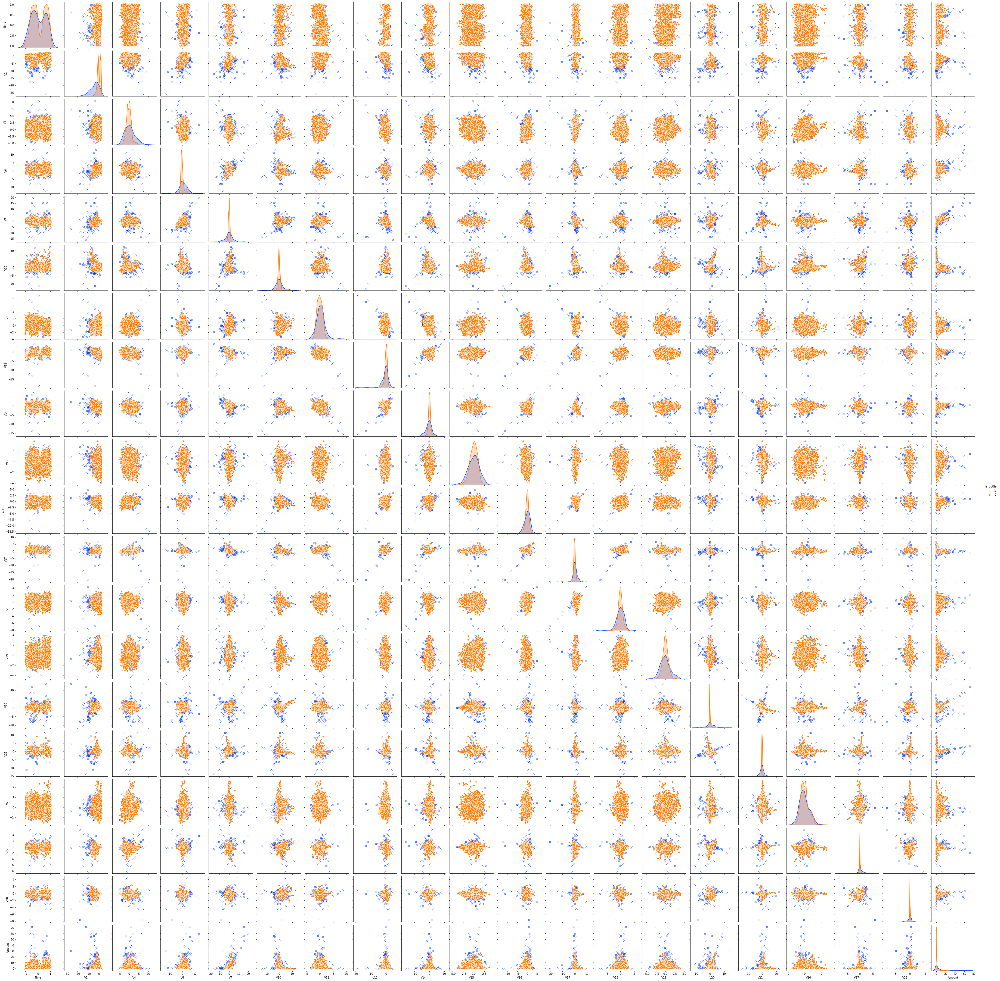

In [52]:
labeled_data = X_test.copy()
labeled_data['is_outlier'] = svm_outliers

sns.pairplot(data=labeled_data, vars = X_test.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');

Isolation Forest

In [64]:
from sklearn.ensemble import IsolationForest

isolation_forest = IsolationForest(n_estimators=100, contamination=0.0013,
                                  max_features=1.0, bootstrap=True)
isolation_forest.fit(X_train)

isolation_outliers = isolation_forest.predict(X_test)
isolation_outliers = np.array([1 if label == -1 else 0 for label in isolation_outliers])

In [65]:
anomalies_report(isolation_outliers)

Total number of outliers: 6
Percentage of outliers:   0.07%


In [66]:
print(classification_report(y_test,isolation_outliers))
tn, fp, fn, tp = confusion_matrix(y_test,isolation_outliers).ravel()
print(tn, fp, fn, tp)

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      8533
           1       0.33      0.17      0.22        12

    accuracy                           1.00      8545
   macro avg       0.67      0.58      0.61      8545
weighted avg       1.00      1.00      1.00      8545

8529 4 10 2


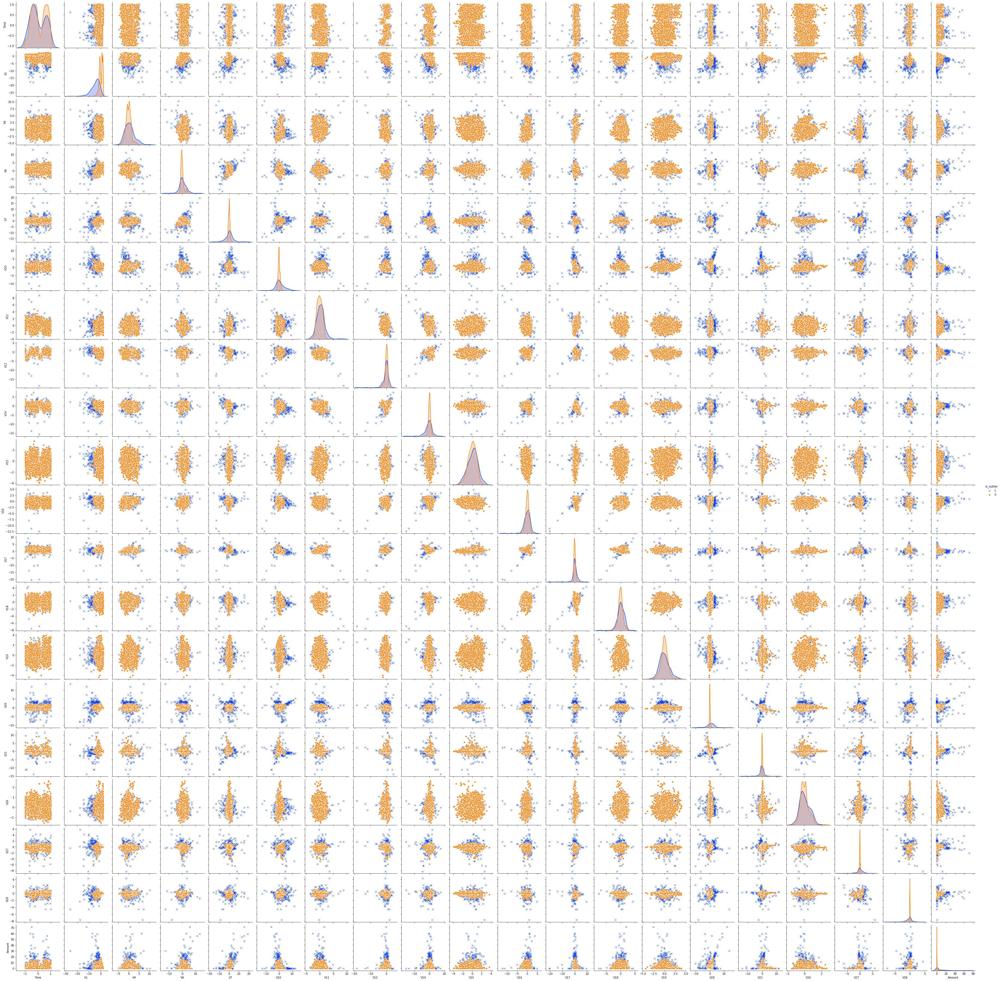

In [57]:
labeled_data = X_test.copy()
labeled_data['is_outlier'] = isolation_outliers

sns.pairplot(data=labeled_data, vars = X_test.columns,
             hue='is_outlier', hue_order=[1, 0],
             markers=['x', 'o'],  palette='bright');